**ADVANCED SOLUTION**

In [1]:
from scipy.io.wavfile import read
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import os, sys, re, pickle, glob
import urllib.request
import zipfile
from sklearn.preprocessing import StandardScaler
from sklearn.svm import SVC
import IPython.display as ipd
from tqdm import tqdm
import librosa
import librosa.display
from sklearn.model_selection import GridSearchCV
from sklearn import svm
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler
from sklearn.datasets import make_classification
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score,matthews_corrcoef,classification_report,ConfusionMatrixDisplay,confusion_matrix
from sklearn.preprocessing import OneHotEncoder,LabelEncoder
from sklearn import preprocessing
import seaborn as sns
from sklearn.ensemble import RandomForestClassifier

# **1 Author**

Student Name: Dhruv Verma

Student ID: 210879364

# **2 Problem formulation** 

The machine learning problem comprises of MLEnd Hums and Whistles dataset. 

The problem that this project aims to solve is **multi class classification problem**, building a machine learning pipeline that takes an input as **Potter, Starwars , Rain and Panther** audio segments(hums and whistles) and predicts the label.

# ****3 Machine Learning pipeline****

The below describes the machine learning pipeline:


### **Data Extraction/Data Preparation**

**Input:** the input audio data in .wav format derives from MLEnd Hums and Whistles public dataset covering Potter, StarWars, Panther and Rain audio segments located in folder 1 of each song download from the public dataset. The total samples of data are: 417 Potter audio instances, 417 StarWars audio instances, 418 Rain audio instances and 418 Panther audio  instances. 

### **Transformation:**

***Feature extraction***: extracing signal data from the input data. 

***Label Encoding***: converting Potter, StarWars, Rain and Panther data labels to a value between 0 and 3 using LabelEncoder.

***Feature scaling***: normalise feature data. 


### **Models:** 

An MLPClassifier, Gaussian Naive Bayes Classifier and Gaussian Process Classifier classification models were used. 

***Output***: Transformed data passed to the machine learning models for training and validation. 


### **Model Evaluation:**

Model validation performance evaluated using classification metrics (f-score, precision and recall) and Matthews Correlation Coefficient (MCC). 

 



# **4 Transformation stage**:

As part of the transformation stage, the following was undertaken:
    
### **Feature extraction**:  

***Input: raw .wav data for 417 Potter audio instances, 417 StarWars audio instances, 418 Rain audio instances and 418 Panther Hum instances.
:***

The original data was in .wav format. In order to reduce dimensionality and transform data, features were extracted using signal processing functions obtained from the Librosa library. The following features were extracted:
    
**Spectral Features**

1. Mel-frequency cepstral coefficients (MFCCs)(librosa.feature.mfcc)
2. Spectral bandwidth (librosa.feature.spectral_bandwidth)

**Onset Detection**

1. Onset Detection (onset_detect)
    
**Beat and tempo Feature**

1. Tempo Estimation (librosa.beat.tempo)

    
***Output: The features extracted resulted in a 4-dimensional feature vector of features***



### **Feature scaling**:

***Input: Feature Data:***

The features extracted were normalised. The reason for choosing this operation, is due to the fact that data from visual inspection was not normally distributed. The intention of using this approach was to preserve the shape of the data. 

***Output: 3 Dimesnional Normalised Feature Array***



### **Label Encoding**:

***Input: Catergocial Data:***

***Output***: Label Encoding converting Potter, StarWars, Rain and Panther categorical data labels with a value between 0 and 3 using LabelEncoder.



# 5 Modelling


The following models were implemented:

1.  MLPCLassifier  Classification
2.  Gaussian Naive Bayes
3. Gaussian Process Classifier 


# **6 Methodology**


The below decribes how the data was trained and validated, including how accuracy was assessed. 


**Data Split:** : The data was split, namely: training data: training data comprising of 70% of instances and validation data: comprising of 30% of instances. The split was stratified such that a balanced proportion of each class was preserved.    

**Predictors and Labels**: An array of normalised features were used as predictors and 'Potter', 'StarWars', 'Panther', 'Rain' were used as y labels for the multiclass classification exercise.

**Model Training:** The models were trainined on the 70% training data split. MLPClassifier, Gaussian Naive Bayes and Gaussian Process Classifier classification models were used. 

**Model Peformance Assessment:** After each model was fitted to the 70% training data split, it was validated on the 30% data split to assess performance. Each models validation performance was compared using a confusion matrix comparing precision, recall and macro avg f1-score.  

A  ***Matthews Correlation Coefficient*** (MCC) testing the correlation between y true labels and y predicted labels obtained during validation.

# 7 Dataset

# Data Preprocessing 

**Get Potter Path**

In [2]:
#show the potter path
potter_path = '/Users/dhruvverma/Desktop/ML mini project/advance_sol/Potter'
potter_source=os.listdir(potter_path)
print(f'Total Potter files found: {len(potter_source)}')
potter_source.sort()

Potter_path_files='/Users/dhruvverma/Desktop/ML mini project/advance_sol/Potter/*'
#store files in variable
Potter_contents=glob.glob(Potter_path_files)
#potter_source

Total Potter files found: 418


**Get Starwars Files**

In [3]:
#show the starwars path

starwars_path = '/Users/dhruvverma/Desktop/ML mini project/advance_sol/StarWars'
starwars_source=os.listdir(starwars_path)
print(f'Total StarWars files found: {len(starwars_source)}')
starwars_source.sort()
#starwars_dir

StarWars_path_files='/Users/dhruvverma/Desktop/ML mini project/advance_sol/StarWars/*'
#store files in variable
StarWars_contents=glob.glob(StarWars_path_files)


Total StarWars files found: 418


In [4]:
#show the Rain path

rain_path = '/Users/dhruvverma/Desktop/ML mini project/advance_sol/Rain'
rain_source=os.listdir(rain_path)
print(f'Total Rain files found: {len(rain_source)}')
rain_source.sort()
#rain_dir

Rain_path_files='/Users/dhruvverma/Desktop/ML mini project/advance_sol/Rain/*'
#store files in variable
Rain_contents=glob.glob(Rain_path_files)

#Variable 'files' holds all available samples.

files = Potter_contents + StarWars_contents

Total Rain files found: 418


In [5]:
#show the Panther path

panther_path = '/Users/dhruvverma/Desktop/ML mini project/advance_sol/Panther'
panther_source=os.listdir(panther_path)
print(f'Total Panther files found: {len(panther_source)}')
panther_source.sort()
#panther_dir

Panther_path_files='/Users/dhruvverma/Desktop/ML mini project/advance_sol/Panther/*'
#store files in variable
Panther_contents=glob.glob(Panther_path_files)

#Variable 'files' holds all available samples.

files = Potter_contents + StarWars_contents + Rain_contents + Panther_contents

Total Panther files found: 418


**FIX INCONSISTENCIES**



In [14]:
MLENDHW_table = []

for file in Potter_contents:
    match1 = re.search("hum", file)
    match2 = re.search("Hum", file)
    fileName = file.split('/')[-1]
    interpreterID = ((file.split('/')[7]).split('_')[0])
    song = 'Potter'
    if match1 or match2:
        MLENDHW_table.append([fileName,interpreterID,'Hum',song])
    else:
        MLENDHW_table.append([fileName,interpreterID,'Whistle', song])

for file in StarWars_contents:
    match1 = re.search("hum", file)
    match2 = re.search("Hum", file)
    fileName = file.split('/')[-1]
    interpreterID = ((file.split('/')[7]).split('_')[0])
    song = 'StarWars'
    if match1 or match2:
        MLENDHW_table.append([fileName,interpreterID,'Hum',song])
    else:
        MLENDHW_table.append([fileName,interpreterID,'Whistle', song])

for file in Rain_contents:
    match1 = re.search("hum", file)
    match2 = re.search("Hum", file)
    fileName = file.split('/')[-1]
    interpreterID = ((file.split('/')[7]).split('_')[0])
    song = 'Rain'
    if match1 or match2:
        MLENDHW_table.append([fileName,interpreterID,'Hum',song])
    else:
        MLENDHW_table.append([fileName,interpreterID,'Whistle', song])

for file in Panther_contents:
    match1 = re.search("hum", file)
    match2 = re.search("Hum", file)
    fileName = file.split('/')[-1]
    interpreterID = ((file.split('/')[7]).split('_')[0])
    song = 'Panther'
    if match1 or match2:
        MLENDHW_table.append([fileName,interpreterID,'Hum',song])
    else:
        MLENDHW_table.append([fileName,interpreterID,'Whistle', song])
MLENDHW_table        

[['S54_hum_2_Potter.wav', 'S54', 'Hum', 'Potter'],
 ['S135_hum_2_Potter.wav', 'S135', 'Hum', 'Potter'],
 ['S36_hum_1_Potter.wav', 'S36', 'Hum', 'Potter'],
 ['S157_hum_1_Potter.wav', 'S157', 'Hum', 'Potter'],
 ['S169_hum_1_Potter.wav', 'S169', 'Hum', 'Potter'],
 ['S77_whistle_2_Potter.wav', 'S77', 'Whistle', 'Potter'],
 ['S53_hum_1_Potter.wav', 'S53', 'Hum', 'Potter'],
 ['S131_hum_1_[Potter].wav', 'S131', 'Hum', 'Potter'],
 ['S188_hum_2_Potter.wav', 'S188', 'Hum', 'Potter'],
 ['S31_hum_2_Potter.wav', 'S31', 'Hum', 'Potter'],
 ['S194_hum_1_[Potter].wav', 'S194', 'Hum', 'Potter'],
 ['S150_hum_2_Potter.wav', 'S150', 'Hum', 'Potter'],
 ['S35_hum_1_[Potter].wav', 'S35', 'Hum', 'Potter'],
 ['S126_whistle_2_Potter.wav', 'S126', 'Whistle', 'Potter'],
 ['S72_whistle_2_Potter.wav', 'S72', 'Whistle', 'Potter'],
 ['S197_hum_2_Potter.wav', 'S197', 'Hum', 'Potter'],
 ['S171_hum_2_Potter.wav', 'S171', 'Hum', 'Potter'],
 ['S209_whistle_2_Potter.wav', 'S209', 'Whistle', 'Potter'],
 ['S94_hum_1_Potter.wa

In [15]:
MLENDHW_df = pd.DataFrame(MLENDHW_table,columns=['file_id','participant','interpretation','song'])
MLENDHW_df['new_col'] = range(1, len(MLENDHW_df) + 1)

column_to_move = MLENDHW_df.pop("new_col")

# insert column with insert(location, column_name, column_value)

MLENDHW_df.insert(0, "new_col", column_to_move)
MLENDHW_df.set_index('new_col')
files[-1]

'/Users/dhruvverma/Desktop/ML mini project/advance_sol/Panther/S189_whistle_1_panther.wav'

In [16]:
potter=MLENDHW_df[MLENDHW_df['song'].str.contains('Potter')].count()
starwars=MLENDHW_df[MLENDHW_df['song'].str.contains('StarWars')].count()
rain=MLENDHW_df[MLENDHW_df['song'].str.contains('Rain')].count()
panther=MLENDHW_df[MLENDHW_df['song'].str.contains('Panther')].count()

potter_hum=MLENDHW_df[(MLENDHW_df["interpretation"]=='Hum') & (MLENDHW_df["song"]=='Potter')].count()
potter_whistle=MLENDHW_df[(MLENDHW_df["interpretation"]=='Whistle') & (MLENDHW_df["song"]=='Potter')].count()

rain_hum=MLENDHW_df[(MLENDHW_df["interpretation"]=='Hum') & (MLENDHW_df["song"]=='Rain')].count()
rain_whistle=MLENDHW_df[(MLENDHW_df["interpretation"]=='Whistle') & (MLENDHW_df["song"]=='Rain')].count()

panther_hum=MLENDHW_df[(MLENDHW_df["interpretation"]=='Hum') & (MLENDHW_df["song"]=='Panther')].count()
panther_whistle=MLENDHW_df[(MLENDHW_df["interpretation"]=='Whistle') & (MLENDHW_df["song"]=='Panther')].count()

starWars_hum=MLENDHW_df[(MLENDHW_df["interpretation"]=='Hum') & (MLENDHW_df["song"]=='StarWars')].count()
starWars_whistle=MLENDHW_df[(MLENDHW_df["interpretation"]=='Whistle') & (MLENDHW_df["song"]=='StarWars')].count()
print('-------------------------------')
print(f'The total Potter  count is: {potter.song}')
print(f'The total StarWars  count is: {starwars.song}')
print(f'The total Rain  count is: {rain.song}')
print(f'The total Panther  count is: {panther.song}')

print('-------------------------------')

print(f'The total Potter Hum count is: {potter_hum.song}')
print(f'The total StarWars Hum count is: {starWars_hum.song}')
print(f'The total Rain Hum count is: {rain_hum.song}')
print(f'The total Panther Hum count is: {panther_hum.song}')
print('-------------------------------')
print(f'The total Potter Whistle count is: {potter_whistle.song}')
print(f'The total StarWars Whistle count is: {starWars_whistle.song}')
print(f'The total Rain Whistle count is: {rain_whistle.song}')
print(f'The total Panther Whistle count is: {panther_whistle.song}')


-------------------------------
The total Potter  count is: 417
The total StarWars  count is: 417
The total Rain  count is: 418
The total Panther  count is: 418
-------------------------------
The total Potter Hum count is: 294
The total StarWars Hum count is: 304
The total Rain Hum count is: 297
The total Panther Hum count is: 304
-------------------------------
The total Potter Whistle count is: 123
The total StarWars Whistle count is: 113
The total Rain Whistle count is: 121
The total Panther Whistle count is: 114


## **Data Exploration**

The below shows the amplitude of data for Potter,  StarWars and Panther samples. The above dataframes enable information to be easily provided about the below plots (Song,Type Song ID, File name) .

The amplitude patterns seems to differ. This could be used to as feature. 

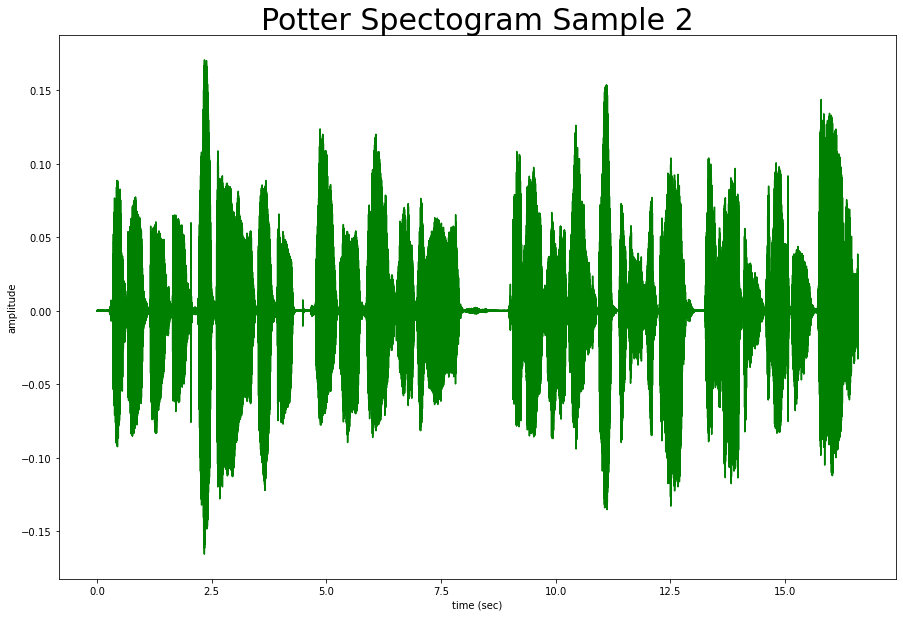

In [7]:
n=2

plt.figure(figsize=(15, 10))
fs = None # Sampling frequency. If None, fs would be 22050
x, sr = librosa.load(Potter_contents[n],sr=None)
t = np.arange(len(x))/sr
plt.plot(t,x,c='g')
plt.title(f'Potter Spectogram Sample {n}',size=30)
plt.xlabel('time (sec)')
plt.ylabel('amplitude')
plt.show()
print('\n')

display(ipd.Audio(Potter_contents[n]))

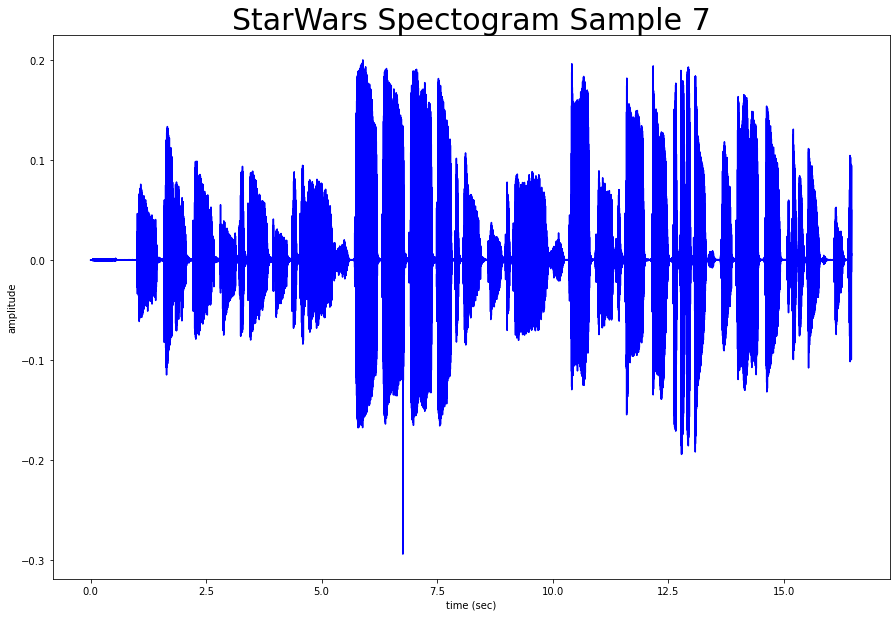

In [8]:
#play a selected song and show what it has been labled as in the below dataframe
plt.figure(figsize=(15, 10))
n=7


#fs = None # Sampling frequency. If None, fs would be 22050
x, sr = librosa.load(StarWars_contents[n],sr=None)
t = np.arange(len(x))/sr
plt.plot(t,x,c='b')
plt.title(f'StarWars Spectogram Sample {n}',size=30)
plt.xlabel('time (sec)')
plt.ylabel('amplitude')
plt.show()
print('\n')
display(ipd.Audio(StarWars_contents[n]))

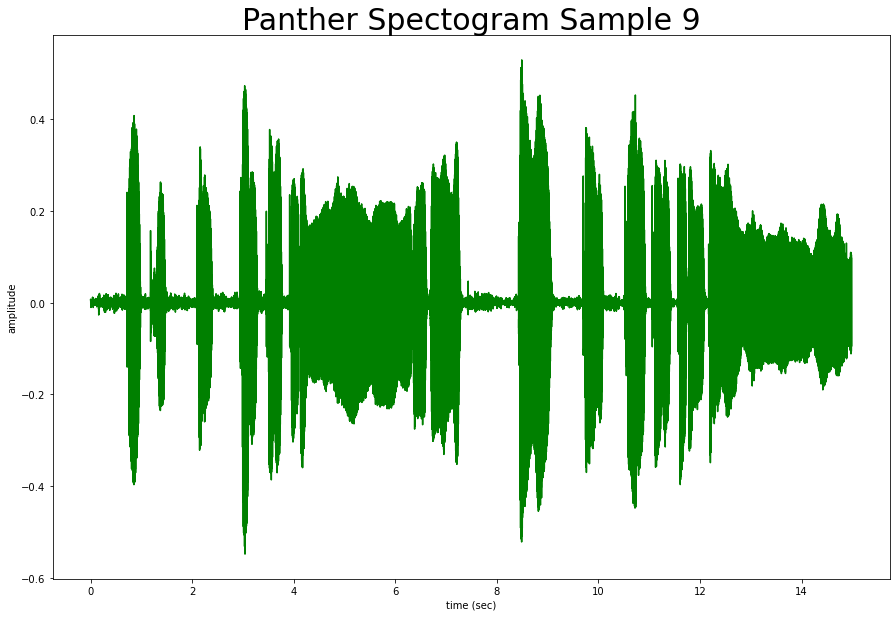

In [9]:
n=9
plt.figure(figsize=(15, 10))
fs = None # Sampling frequency. If None, fs would be 22050
x, sr = librosa.load(Panther_contents[n],sr=None)
t = np.arange(len(x))/sr
plt.plot(t,x,c='g')
plt.title(f'Panther Spectogram Sample {n}',size=30)
plt.xlabel('time (sec)')
plt.ylabel('amplitude')
plt.show()
print('\n')

display(ipd.Audio(Panther_contents[n]))

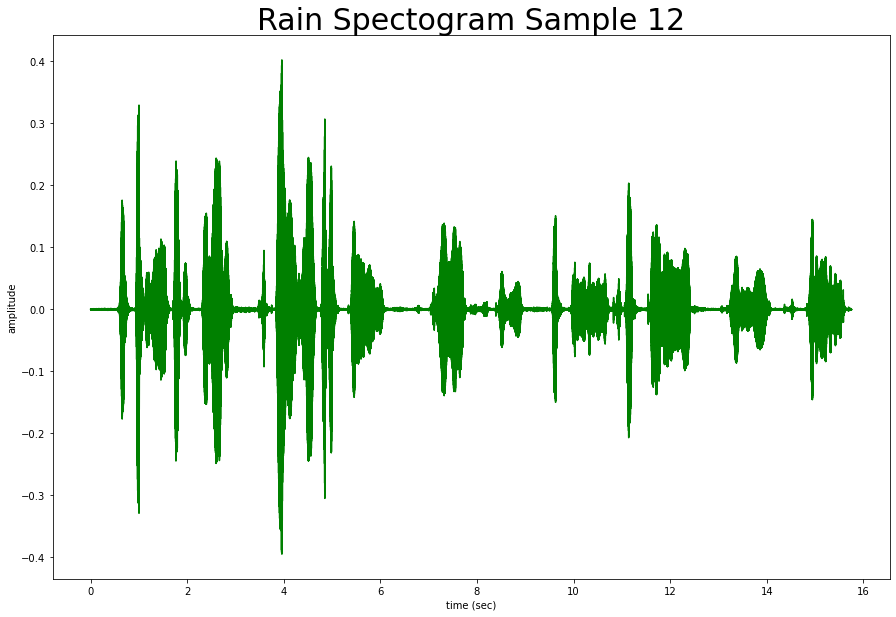

In [10]:
n=12
plt.figure(figsize=(15, 10))
fs = None # Sampling frequency. If None, fs would be 22050
x, sr = librosa.load(Rain_contents[n],sr=None)
t = np.arange(len(x))/sr
plt.plot(t,x,c='g')
plt.title(f'Rain Spectogram Sample {n}',size=30)
plt.xlabel('time (sec)')
plt.ylabel('amplitude')
plt.show()
print('\n')

display(ipd.Audio(Rain_contents[n]))

## **Feature Extraction**

Extract features using the Librosa libary.

In [12]:
#lists of features
mfcc_list,onset_env_list,spec_bw_list,tempo_list,zercross_list=[],[],[],[],[]

for i in tqdm(range(len(files))):
  n=i

  y, sr = librosa.load(files[n],sr=None)
    
  mfcc = librosa.feature.mfcc(y=y, sr=sr) 
  mfcc_list.append(np.mean(mfcc))  
  
  onset_env = librosa.onset.onset_strength(y=y, sr=sr)
  onset_env_list.append(np.mean(onset_env))
  
  spec_bw = librosa.feature.spectral_bandwidth(y=y, sr=sr)
  spec_bw_list.append(np.mean(spec_bw))

  tempo = librosa.beat.tempo(y, sr=sr)
  tempo_list.append(tempo)

  # zero_cross = librosa.feature.zero_crossing_rate(y=y)
  # zercross_list.append(zero_cross)
    


  0%|          | 0/1670 [00:00<?, ?it/s]/var/folders/7m/hw2mlr112h941njyncfg62sr0000gn/T/ipykernel_63060/2851937811.py:18: FutureWarning: Pass y=[0.00727844 0.00720215 0.00727844 ... 0.00028992 0.00054932 0.00061035] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  tempo = librosa.beat.tempo(y, sr=sr)
  0%|          | 1/1670 [00:00<07:41,  3.61it/s]/var/folders/7m/hw2mlr112h941njyncfg62sr0000gn/T/ipykernel_63060/2851937811.py:18: FutureWarning: Pass y=[ 0.0000000e+00 -1.5258789e-05  3.0517578e-05 ... -4.2205811e-02
 -4.2205811e-02 -4.2068481e-02] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  tempo = librosa.beat.tempo(y, sr=sr)
  0%|          | 2/1670 [00:00<06:39,  4.17it/s]/var/folders/7m/hw2mlr112h941njyncfg62sr0000gn/T/ipykernel_63060/2851937811.py:18: FutureWarning: Pass y=[ 0.          0.          0.         ... -0.01327515 -0.01332092
 -0.01330566] as keyword args. From version

**Create datafrane showing each label and extracted features**

In [17]:
#create dataframe with features and labels
song=MLENDHW_df['song'].tolist()
df=pd.DataFrame(song,columns=['song'])
df['MFCC']=mfcc_list
df['onset_env']=onset_env_list
df['Spec_Bandwidth']=spec_bw_list
df['Tempo']=tempo_list
# df['Centroid'] = zercross_list
df

,song,MFCC,onset_env,Spec_Bandwidth,Tempo
0,Potter,-10.173121,1.065233,3065.836372,[161.4990234375]
1,Potter,-16.610855,0.560665,3182.265076,[151.99908088235293]
2,Potter,-23.337149,0.880137,2875.809809,[105.46875]
3,Potter,-22.288271,0.739635,3112.014194,[132.51201923076923]
4,Potter,-18.114054,1.032400,4246.476003,[126.04801829268293]
...,...,...,...,...,...
1665,Panther,-23.956453,0.846336,3097.711158,[129.19921875]
1666,Panther,-22.742037,0.449778,3959.245833,[105.46875]
1667,Panther,-13.311168,1.111007,5187.939811,[117.45383522727273]
1668,Panther,-14.512540,0.933663,2260.417231,[126.04801829268293]


**Understand Dataframe Datatypes**


Explore the dtypes of the extracted features 

In [18]:
df.dtypes

song               object
MFCC              float32
onset_env         float32
Spec_Bandwidth    float64
Tempo              object
dtype: object

**Create Features Dataframe**

In [19]:
# Get features and convert to all to a float. 
features = df.iloc[:,1:8].astype(float)
features

,MFCC,onset_env,Spec_Bandwidth,Tempo
0,-10.173121,1.065233,3065.836372,161.499023
1,-16.610855,0.560665,3182.265076,151.999081
2,-23.337149,0.880137,2875.809809,105.468750
3,-22.288271,0.739635,3112.014194,132.512019
4,-18.114054,1.032400,4246.476003,126.048018
...,...,...,...,...
1665,-23.956453,0.846336,3097.711158,129.199219
1666,-22.742037,0.449778,3959.245833,105.468750
1667,-13.311168,1.111007,5187.939811,117.453835
1668,-14.512540,0.933663,2260.417231,126.048018


**Inspect Distribution of extracted features**

The features from visual inspection appear to **not to be** normally distributed. Data will be normilised later on. 

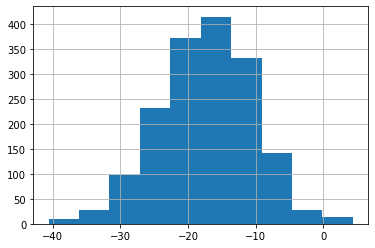

In [20]:
plt.hist(features['MFCC'])
plt.grid(True)
plt.show()

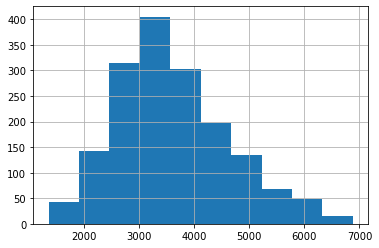

In [21]:
plt.hist(features['Spec_Bandwidth'])
plt.grid(True)
plt.show()

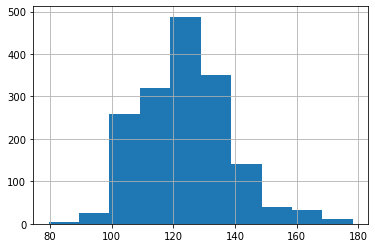

In [22]:
plt.hist(features['Tempo'])
plt.grid(True)
plt.show()

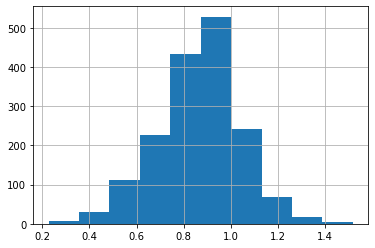

In [100]:
plt.hist(features['onset_env'])
plt.grid(True)
plt.show()

## **Get Target Labels**

Get targets (Potter, Starwars, Panther and Rain)

In [24]:
# Get target from dataframe
target = df.iloc[:, 0]

## **Feature Selection:**

The below correlation coefficients demonstrate that there ***is not*** a strong correlation between features, which means none will be removed. This is also shown in the heatmap below. Correlation Coefficient threshold= 0.50.

In [25]:
print("\nCorrelation coefficients:")
corr=abs(features.corr())
corr 


Correlation coefficients:


,MFCC,onset_env,Spec_Bandwidth,Tempo
MFCC,1.000000,0.334406,0.192313,0.089732
onset_env,0.334406,1.000000,0.109825,0.150818
Spec_Bandwidth,0.192313,0.109825,1.000000,0.037028
Tempo,0.089732,0.150818,0.037028,1.000000


In [26]:
threshold = corr[corr.iloc[:, :] >= 0.5]
threshold

,MFCC,onset_env,Spec_Bandwidth,Tempo
MFCC,1.0,NaN,NaN,NaN
onset_env,NaN,1.0,NaN,NaN
Spec_Bandwidth,NaN,NaN,1.0,NaN
Tempo,NaN,NaN,NaN,1.0


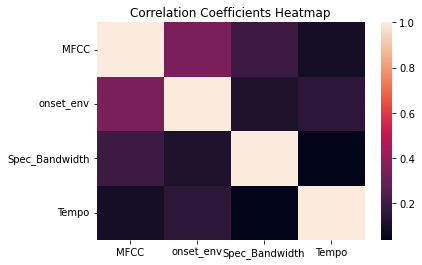

In [27]:
ax = plt.axes()
sns.heatmap(corr,ax=ax)
ax.set_title('Correlation Coefficients Heatmap')
plt.show()

As shown above, all features meet the threshold value of 0.5 and thus will be inluded.

### **Create NumpPy Predictor array (X) and binary label(y)**

As shown below, there are 1670 instances consisting of 4 features, stored in X and one binary label stored in y. y labels have been encoded.

In [28]:
#convert features to np array and create X predictor variable
X=np.array(features)

#convert target to np array and store in y label 
y=np.array(target)
#label encoder 
le = preprocessing.LabelEncoder()
le.fit(y)
le.classes_
y=le.transform(y)
#namemapping dict
namemapping = dict(zip(le.classes_, le.transform(le.classes_)))
print(f'The shape of the X predictor is {X.shape}')
print(f'The shape of the y label is {y.shape}')
print(f'The mapping of y label encoding is: {namemapping}')

The shape of the X predictor is (1670, 4)
The shape of the y label is (1670,)
The mapping of y label encoding is: {'Panther': 0, 'Potter': 1, 'Rain': 2, 'StarWars': 3}


# 8 Results


Different ML  algorithms create classifiers using different biases, which can lead to varying performance.  As such, RandomForestClassifier and Support Vector Machine classification models have been used below. 

**Split the data into training and validation**:

The data was split, namely: training data: training data comprising of 70% of instances and validation data: comprising of 30% of instances. The randomisation of the training data and validation data were controlled using a random number generator, enabling a deterministic train-test to split to be achieved. The split was stratified such that a balanced proportion of each class was preserved.

In [41]:
#Data Split
                  
X_train, X_val, y_train, y_val = train_test_split(X,y,test_size=0.3,random_state=3,stratify=y)
                  
X_train.shape, X_val.shape, y_train.shape, y_val.shape

((1169, 4), (501, 4), (1169,), (501,))

**Normalising the Data**:

In [42]:
mean = X_train.mean(0)
sd =  X_train.std(0)

X_train = (X_train-mean)/sd
X_val  = (X_val-mean)/sd

***MODEL 1: MLP CLASSIFIER***

In [94]:
from sklearn.neural_network import MLPClassifier

clf = MLPClassifier(random_state=1, max_iter=400).fit(X_train, y_train)
clf_train = clf.score(X_train,y_train)
clf_mlp = clf.score(X_val, y_val)
print(f'\n MLPClassifier training accuracy is : {clf_train}')
print(f'\n MLPClassifier validation accuracy is : {clf_mlp}')


 MLPClassifier training accuracy is : 0.5551753635585971

 MLPClassifier validation accuracy is : 0.5129740518962076


/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (400) reached and the optimization hasn't converged yet.
  warnings.warn(


**MLP CLASSIFIER EVALUATION**

In [79]:
y_preds = clf.predict(X_val)
print(classification_report(y_val, y_preds))
mlp_MC=matthews_corrcoef(y_val, y_preds)
print(f'\n MLPClassifier matthews_corrcoef : {mlp_MC}')

              precision    recall  f1-score   support

           0       0.46      0.60      0.52       126
           1       0.49      0.28      0.36       125
           2       0.44      0.57      0.50       125
           3       0.72      0.61      0.66       125

    accuracy                           0.51       501
   macro avg       0.53      0.51      0.51       501
weighted avg       0.53      0.51      0.51       501


 MLPClassifier matthews_corrcoef : 0.35610386861920296


**MLP CLASSIFIER CONFUSION MATRIX**

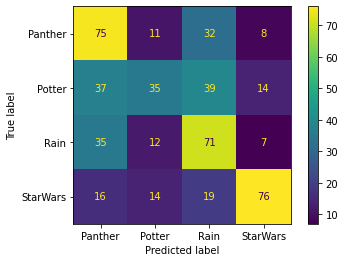

In [81]:
cm=confusion_matrix(y_val, y_preds)
cmd_obj=ConfusionMatrixDisplay(cm,display_labels=['Panther','Potter','Rain','StarWars'])
cmd_obj.plot()

***MODEL 2: GAUSSIAN NAIVE BAYES***

In [96]:
from sklearn.naive_bayes import GaussianNB
gnb = GaussianNB()
gnb.fit(X_train, y_train)
gnb_train = gnb.score(X_train, y_train)
gnb_score = gnb.score(X_val, y_val)
print(f'\n GaussianNB training accuracy is : {gnb_train}')
print(f'\n GaussianNB validation accuracy is : {gnb_score}')


 GaussianNB training accuracy is : 0.514114627887083

 GaussianNB validation accuracy is : 0.500998003992016


**GAUSSIAN NB EVALUATION**

In [97]:
y_preds = gnb.predict(X_val)
print(classification_report(y_val, y_preds))
gnb_MC=matthews_corrcoef(y_val, y_preds)
print(f'\n NaiveBayesClassifier matthews_corrcoef : {gnb_MC}')

              precision    recall  f1-score   support

           0       0.41      0.64      0.50       126
           1       0.62      0.19      0.29       125
           2       0.45      0.48      0.47       125
           3       0.67      0.69      0.68       125

    accuracy                           0.50       501
   macro avg       0.53      0.50      0.48       501
weighted avg       0.53      0.50      0.48       501


 NaiveBayesClassifier matthews_corrcoef : 0.3465433446703886


**GAUSSIAN NAIVE BAYES CONFUSION MATRIX**

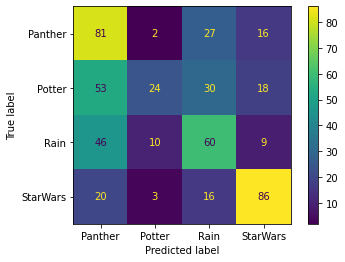

In [84]:
cm=confusion_matrix(y_val, y_preds)
cmd_obj=ConfusionMatrixDisplay(cm,display_labels=['Panther','Potter','Rain','StarWars'])
cmd_obj.plot()

***MODEL 3: GAUSSIAN PROCESS CLASSIFIER***

In [99]:
from sklearn.gaussian_process import GaussianProcessClassifier
from sklearn.gaussian_process.kernels import RBF

kernel = 1.0 * RBF(1.0)

gpc = GaussianProcessClassifier(kernel=kernel,random_state=0).fit(X_train, y_train)
gpc.fit(X_train, y_train)
gpc_train = gpc.score(X_train, y_train)
gpc_score = gpc.score(X_val, y_val)
print(f'\n GaussianProcessClassifier training accuracy is : {gpc_train}')
print(f'\n GaussianProcessClassifier validation accuracy is : {gpc_score}')


 GaussianProcessClassifier training accuracy is : 0.542343883661249

 GaussianProcessClassifier validation accuracy is : 0.5029940119760479


**GAUSSIAN PROCESS EVALUATION**

In [86]:
y_preds = gpc.predict(X_val)
print(classification_report(y_val, y_preds))
gpc_MC=matthews_corrcoef(y_val, y_preds)
print(f'\n GaussianProcessClassifier matthews_corrcoef : {gpc_MC}')

              precision    recall  f1-score   support

           0       0.43      0.61      0.50       126
           1       0.68      0.15      0.25       125
           2       0.42      0.60      0.50       125
           3       0.71      0.65      0.68       125

    accuracy                           0.50       501
   macro avg       0.56      0.50      0.48       501
weighted avg       0.56      0.50      0.48       501


 GaussianProcessClassifier matthews_corrcoef : 0.3517993614234688


**GAUSSIAN PROCESS CONFUSION MATRIX**

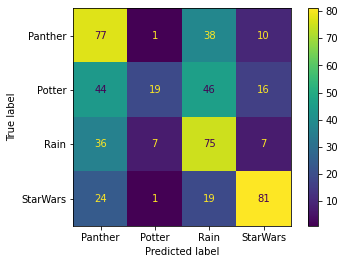

In [87]:
cm=confusion_matrix(y_val, y_preds)
cmd_obj=ConfusionMatrixDisplay(cm,display_labels=['Panther','Potter','Rain','StarWars'])
cmd_obj.plot()

# 9. Conclusions

In [92]:
print('\n Performance Summary:')


print(f'\n MLP Classifier validation accuracy : {clf_mlp}')

print (f'\n Gaussian Naive Bayes validation accuracy : {gnb_score}')

print (f'\n Gaussian Process Classifier validation accuracy : {gpc_score}')

print('--------------------------------------------------------')

print(f'\n Matthews correlation coefficient:')
print(f'\n MLPClassifier matthews_corrcoef : {mlp_MC}')

print(f'\n GaussianNaiveBayes matthews_corrcoef : {gnb_MC}')

print(f'\n GaussianProcessClassifier matthews_corrcoef : {gpc_MC}')

print('--------------------------------------------------------')


 Performance Summary:

 MLP Classifier validation accuracy : 0.5129740518962076

 Gaussian Naive Bayes validation accuracy : 0.500998003992016

 Gaussian Process Classifier validation accuracy : 0.5029940119760479
--------------------------------------------------------

 Matthews correlation coefficient:

 MLPClassifier matthews_corrcoef : 0.35610386861920296

 GaussianNaiveBayes matthews_corrcoef : 0.3465433446703886

 GaussianProcessClassifier matthews_corrcoef : 0.3517993614234688
--------------------------------------------------------


## **Model Evaluation**: Summary 

As shown above, the **MLP Classifier** (hyperparamets- random_state=1, max_iter = 400) produced the **best accuracy**. It also has the **highest MCC of 0.356**. As observed from the various models above the validation accuracy is less than training accuracy (though by not much margin), as expected. In order to increase the accuracy more features can be extracted from the dataset via Librosa library or something alike. Furthermore, the imbalance in number of hums and whistles contribute to reduced accuracy of the models.

